# AAPL Stock Forecasting

In [1]:
versioninfo()

Julia Version 1.9.2
Commit e4ee485e909 (2023-07-05 09:39 UTC)
Platform Info:
  OS: macOS (arm64-apple-darwin22.4.0)
  CPU: 10 × Apple M1 Pro
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-14.0.6 (ORCJIT, apple-m1)
  Threads: 1 on 8 virtual cores
Environment:
  JULIA_NUM_THREADS = 


In [2]:
# Importing data handling libraries
using CSV, DataFrames, TimeSeries

using Statistics: mean, std
using Impute

# Importing partial autocorrelation function
using StatsBase: pacf, autocor

# Functionality for splitting and normalizing the data
using MLUtils#: shuffleobs, rescale!
using FeatureTransforms: StandardScaling, fit!, apply!

# Import Plots, and StatsPlots for visualizations and diagnostics.
using Plots, StatsPlots

In [3]:
PATH = "/Users/danieldiazalmeida/Downloads/DataScienceDatasets/"
data = "aapl_raw_data.csv"

df = DataFrame(CSV.File(PATH*data))
first(df, 1)

Row,date,open,high,low,close,volume,adjusted_close,change_percent,avg_vol_20d
,Date,Float64,Float64,Float64,Float64,Int64,Float64,Float64?,Float64?
1,1980-12-12,28.7392,28.8736,28.7392,28.7392,2093900,0.0994,missing,missing


In [4]:
last(df, 1)

Row,date,open,high,low,close,volume,adjusted_close,change_percent,avg_vol_20d
,Date,Float64,Float64,Float64,Float64,Int64,Float64,Float64?,Float64?
1,2023-08-25,177.38,179.15,175.82,178.61,45650607,178.61,1.26,5.68516e7


In [5]:
describe(df)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,Type
1,date,,1980-12-12,,2023-08-25,0,Date
2,open,112.278,11.1328,52.0016,702.411,0,Float64
3,high,113.635,11.1328,52.9984,705.071,0,Float64
4,low,110.857,10.9984,50.9376,699.569,0,Float64
5,close,112.273,10.9984,51.996,702.1,0,Float64
6,volume,1.85458e7,0,5.80785e6,332607200,0,Int64
7,adjusted_close,18.0239,0.0381,0.4132,196.185,0,Float64
8,change_percent,0.109855,-51.87,0.0,33.29,1,"Union{Missing, Float64}"
9,avg_vol_20d,3.2405e8,1.48926e7,2.27896e8,1.87919e9,19,"Union{Missing, Float64}"


In [6]:
df_shape = nrow(df), ncol(df)
println("The DataFrame shape is $df_shape")

The DataFrame shape is (10766, 9)


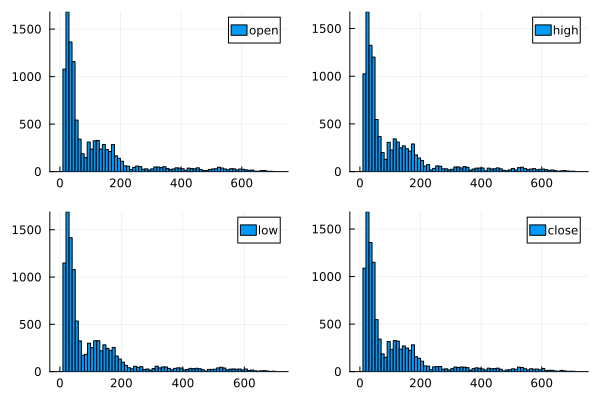

In [7]:
plot([histogram(df[!, col]; label=col) for col in ["open","high","low","close"]]...)

In [8]:
dates = Date(1980, 12, 12):Day(1):Date(2023, 08, 25)
tempdf = DataFrame(date = dates);

In [9]:
alldf = outerjoin(tempdf, df, on = :date, order=:left)
dfopen = select(alldf, [:date, :open])
first(dfopen)

Row,date,open
,Date,Float64?
1,1980-12-12,28.7392


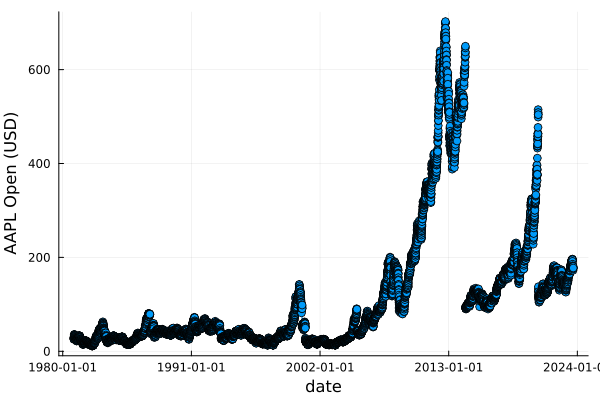

In [10]:
plot(dfopen[!, :date], dfopen[!, :open]; 
    xlabel="date", ylabel="AAPL Open (USD)", legend=false, marker=:o)

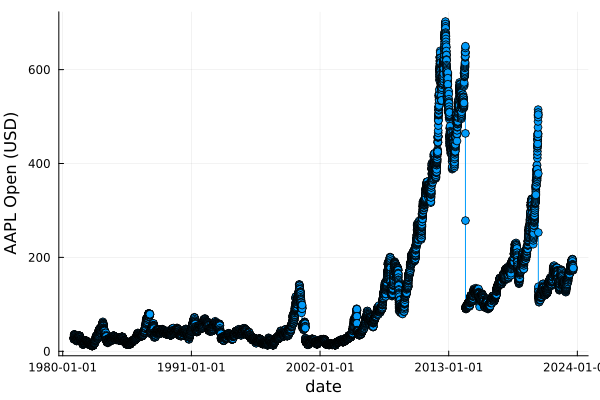

In [11]:
dfopen.open = Impute.interp(dfopen[!, :open])
plot(dfopen[!, :date], dfopen[!, :open]; 
    xlabel="date", ylabel="AAPL Open (USD)", legend=false, marker=:o)

In [12]:
# Calculate the average of all non-missing values in the column
#mean_open = median(skipmissing(dfopen[!, :open]))
# Replace missing values with the mean_value
#replace!(dfopen[!, :open], missing => mean_open)

In [13]:
pacf(dfopen.open, 1)

MethodError: MethodError: no method matching pacf(::Vector{Union{Missing, Float64}}, ::Int64)

# Modeling

In [14]:
df = TimeArray(dfopen, timestamp = :date)
first(df)

1×1 TimeArray{Union{Missing, Float64}, 1, Date, Vector{Union{Missing, Float64}}} 1980-12-12 to 1980-12-12
│            │ open    │
├────────────┼─────────┤
│ 1980-12-12 │ 28.7392 │

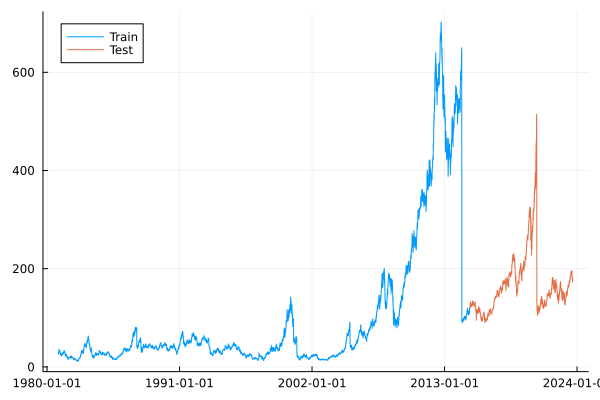

In [15]:
# data spliting index
split_idx = (nrow(dfopen)*.80) |> round |> Int
# train dates 
traindate = dates[1:split_idx]
# test data selection by date
testdate = dates[split_idx:end]

plot(df[traindate]; label="Train")
plot!(df[testdate]; label="Test")

In [16]:
train_data = df[traindate] |> values
test_data = df[testdate] |> values

train_data = collect(skipmissing(train_data))
test_data = collect(skipmissing(test_data));

In [17]:
temp_scaling = StandardScaling()
fit!(temp_scaling, train_data)
apply!(train_data, temp_scaling)
apply!(test_data, temp_scaling)

3120-element Vector{Float64}:
 0.13976738582835857
 0.1512686431238038
 0.1697274511288393
 0.19308494279674968
 0.20174638347603555
 0.20211910940690642
 0.2024918353377773
 0.20286456126864819
 0.20323728719951914
 0.2042312230151749
 ⋮
 0.5557295246802935
 0.521367743624766
 0.5279229869804003
 0.5344782303360346
 0.5410334736916691
 0.5551615613570617
 0.5655268920060433
 0.5807909063178994
 0.5574334146499892

In [162]:
floater(x) = Float32.(x)

function get_seq(data::Vector{Float64}, step::Int64)
    """
    """
    seq_length = (length(data) - step)
    x = [data[i:(i + step - 1)] for i = 1:(seq_length)]
    y = [data[(i + step)] for i = 1:(seq_length)]

    x = map(floater, x)
    y = map(floater, y)
    return x, y
end

get_seq (generic function with 1 method)

In [163]:
Xtrain, ytrain = get_seq(train_data, 1);
xtest, ytest = get_seq(test_data, 1);

In [20]:
using Flux, ProgressMeter
using Flux.Losses: mse

In [164]:
trainloader = Flux.Data.DataLoader(
    (Xtrain, ytrain), batchsize=32, shuffle=true, partial=false) 

testloader = Flux.Data.DataLoader(
    (xtest, ytest), batchsize=32, shuffle=false)

98-element DataLoader(::Tuple{Vector{Vector{Float32}}, Vector{Float32}}, batchsize=32)
  with first element:
  (32-element Vector{Vector{Float32}}, 32-element Vector{Float32},)

In [142]:
input_size = 1
hidden_size = 16
output_size = 1
model = Chain(
    LSTM(input_size => hidden_size),
    #Flux.relu,
    Dense(hidden_size => 1)
)

Chain(
  Recur(
    LSTMCell(1 => 16),                  # 1_184 parameters
  ),
  Dense(16 => 1),                       # 17 parameters
)         # Total: 7 trainable arrays, 1_201 parameters,
          # plus 2 non-trainable, 32 parameters, summarysize 5.152 KiB.

In [22]:
loss(m, x, y) = mean((m(x) .- y).^2)

loss (generic function with 1 method)

In [26]:
#databatch = Iterators.take(trainloader, 1) |> collect
databatch = first(trainloader)

(Float32[-0.52659273, -0.5678212, 1.7425628, -0.39304754, -0.45165, 0.7346323, -0.419685, -0.5372477, -0.4137744, -0.3646607  …  -0.46850714, -0.42143434, 0.48026425, -0.24488483, -0.35933322, -0.33802325, 0.5218704, 0.50646436, -0.5137511, -0.43566748], Float32[-0.5267915, -0.5678212, 1.6905998, -0.38949585, -0.45165, 0.71803355, -0.41881034, -0.53899705, -0.4143575, -0.3629114  …  -0.46789753, -0.42055967, 0.4889711, -0.2377815, -0.35933322, -0.34335074, 0.5377734, 0.5341554, -0.5137511, -0.43654215])

In [100]:
databatch


(Vector{Float32}[[-0.38772002], [-0.42851114], [-0.24715763], [-0.53593576], [-0.5651972], [-0.4019532], [-0.46047613], [-0.58422965], [0.19848344], [-0.22089784]  …  [-0.43034], [-0.5323576], [0.09511127], [0.41011226], [-0.58074236], [0.002888225], [-0.52710956], [-0.5217026], [-0.31496394], [3.5420835]], Float32[-0.3859707, -0.40903002, -0.23799354, -0.5395139, -0.5670261, -0.40012434, -0.4560233, -0.5852463, 0.20422839, -0.23155284  …  -0.42143434, -0.53060824, 0.09487462, 0.4123983, -0.58030504, 0.004095147, -0.52710956, -0.52318686, -0.35575506, 3.561326])

In [32]:
lstm(databatch[1])

16-element Vector{Float32}:
  0.030560536
  0.049892895
 -0.05759443
  0.011382546
  0.09704592
 -0.14375588
  0.08536641
 -0.1139215
  0.097337276
 -0.045920867
 -0.13538456
  0.08188161
 -0.05675818
  0.08109507
  0.0811492
  0.021595081

In [34]:
model(reshape(databatch[1],32,1))

1×1 Matrix{Float32}:
 -0.022386963

In [79]:
model(Xtrain[1])

1-element Vector{Float32}:
 -0.027685143

In [48]:
mse(model(databatch[1]), databatch[2][end])

0.049479682f0

In [95]:
databatch[1]

32-element Vector{Vector{Float32}}:
 [-0.22089784]
 [-0.5598697]
 [2.9969695]
 [-0.13748676]
 [-0.3978118]
 [-0.5403091]
 [-0.19696388]
 [-0.5993886]
 [-0.41729957]
 [1.9277925]
 ⋮
 [-0.40461695]
 [-0.2812496]
 [-0.42326316]
 [-0.400999]
 [0.05712588]
 [-0.5716777]
 [-0.4143575]
 [-0.42326316]
 [-0.38414186]

In [96]:
yhat = [model(x1) for x1 in databatch[1]]

32-element Vector{Vector{Float32}}:
 [0.012392206]
 [0.03630671]
 [-0.12082955]
 [-0.05143921]
 [0.015362551]
 [0.060404733]
 [0.061101504]
 [0.07898002]
 [0.06994368]
 [-0.062802956]
 ⋮
 [0.04180501]
 [0.02826828]
 [0.025064206]
 [0.017649023]
 [-0.017370757]
 [-0.0001297762]
 [-0.0021560318]
 [-0.0048695332]
 [-0.010925997]

In [103]:
# Initialise the optimiser for this model:
opt= Adam(0.001f0)
opt_state = Flux.setup(opt, model)

for data in trainloader
    # Unpack this element (for supervised training):
    input, label = data

    # Calculate the gradient of the objective
    # with respect to the parameters within the model:
    grads = Flux.gradient(model) do m
        result = [m(x) for x in input]
        loss(result, label)
    end

    # Update the parameters so as to reduce the objective,
    # according the chosen optimisation rule:
    Flux.update!(opt_state, model, grads[1])
end

MethodError: MethodError: no method matching loss(::Vector{Vector{Float32}}, ::Vector{Float32})

Closest candidates are:
  loss(::Any, ::Any, !Matched::Any)
   @ Main ~/Documents/DataScienceProjects/notebooks/AAPLStockForecasting_Julia.ipynb:1


In [167]:
Flux.train!(model, databatch, opt_state) do m, x, y
    #yhat = [m(x) for x in x]
    loss(m(x), y)
  end

MethodError: MethodError: no method matching (::var"#129#130")(::Chain{Tuple{Flux.Recur{Flux.LSTMCell{Matrix{Float32}, Matrix{Float32}, Vector{Float32}, Tuple{Matrix{Float32}, Matrix{Float32}}}, Tuple{Matrix{Float32}, Matrix{Float32}}}, Dense{typeof(identity), Matrix{Float32}, Vector{Float32}}}}, ::Vector{Float32})

Closest candidates are:
  (::var"#129#130")(::Any, ::Any, !Matched::Any)
   @ Main ~/Documents/DataScienceProjects/notebooks/AAPLStockForecasting_Julia.ipynb:3


In [73]:
for (x, y) in zip(Xtrain[1:end], ytrain)
    print(x, y)
end

In [64]:
dataset = zip(Xtrain[1:end], ytrain)

zip(Vector{Float32}[[-0.49784812], [-0.5010817], [-0.5043153], [-0.5075489], [-0.5217026], [-0.5182039], [-0.51279694], [-0.50134677], [-0.49806017], [-0.49477354]  …  [0.13870245], [0.13787417], [0.13704589], [0.13621761], [0.1394124], [0.1394124], [0.1502037], [0.1502037], [0.14672494], [0.14324616]], Float32[-0.5010817, -0.5043153, -0.5075489, -0.5217026, -0.5182039, -0.51279694, -0.50134677, -0.49806017, -0.49477354, -0.49148694  …  0.13787417, 0.13704589, 0.13621761, 0.1394124, 0.1394124, 0.1502037, 0.1502037, 0.14672494, 0.14324616, 0.13976738])

In [57]:
dataset[1]

MethodError: MethodError: no method matching getindex(::Base.Iterators.Zip{Tuple{Vector{Vector{Float32}}, Vector{Float32}}}, ::Int64)

## Model Training

In [159]:
input_size = 1
hidden_size = 16
output_size = 1
model = Chain(
    LSTM(input_size => hidden_size),
    #Flux.relu,
    Dense(hidden_size => 1)
)

Chain(
  Recur(
    LSTMCell(1 => 16),                  # 1_184 parameters
  ),
  Dense(16 => 1),                       # 17 parameters
)         # Total: 7 trainable arrays, 1_201 parameters,
          # plus 2 non-trainable, 32 parameters, summarysize 5.152 KiB.

In [160]:
loss(m, x, y) = mean((m(x) .- y).^2) 

loss (generic function with 1 method)

### Option 1

In [35]:
opt= Adam(0.001f0)
opt_state = Flux.setup(opt, model)
for i=1:1_000
    for (x, y) in zip(Xtrain, ytrain)
        #Flux.train!(loss, ps, trainloader, opt)
        Flux.train!(loss, model, [(x, y)], opt_state)
    end
end


### Option 2

In [158]:
opt= Adam(0.001f0)
opt_state = Flux.setup(opt, model)
for i=1:1_000
    for (x, y) in zip(Xtrain, ytrain)
        Flux.train!((m,x,y) -> loss(m, x, y), model, [(x, y)], opt_state)
    end
end

GPUCompiler.InvalidIRError: InvalidIRError: compiling MethodInstance for (::GPUArrays.var"#broadcast_kernel#32")(::Metal.mtlKernelContext, ::MtlDeviceVector{Float32, 1}, ::Base.Broadcast.Broadcasted{Metal.MtlArrayStyle{1}, Tuple{Base.OneTo{Int64}}, typeof(*), Tuple{Base.Broadcast.Broadcasted{Metal.MtlArrayStyle{1}, Nothing, typeof(*), Tuple{Base.Broadcast.Extruded{MtlDeviceVector{Float32, 1}, Tuple{Bool}, Tuple{Int64}}, Int64}}, Base.Broadcast.Broadcasted{Metal.MtlArrayStyle{1}, Nothing, typeof(conj), Tuple{Base.Broadcast.Broadcasted{Metal.MtlArrayStyle{1}, Nothing, typeof(^), Tuple{Base.Broadcast.Extruded{MtlDeviceVector{Float32, 1}, Tuple{Bool}, Tuple{Int64}}, Int64}}}}}}, ::Int64) resulted in invalid LLVM IR
Reason: unsupported use of double value
Stacktrace:
 [1] multiple call sites
   @ unknown:0
Reason: unsupported use of double value
Stacktrace:
 [1] power_by_squaring
   @ ./intfuncs.jl:0
 [2] multiple call sites
   @ unknown:0
Reason: unsupported use of double value
Stacktrace:
 [1] *
   @ ./float.jl:410
 [2] power_by_squaring
   @ ./intfuncs.jl:269
 [3] multiple call sites
   @ unknown:0
Reason: unsupported use of double value
Stacktrace:
 [1] ==
   @ ./float.jl:533
 [2] isone
   @ ./number.jl:62
 [3] power_by_squaring
   @ ./intfuncs.jl:271
 [4] multiple call sites
   @ unknown:0
Reason: unsupported use of double value
Stacktrace:
 [1] ==
   @ ./float.jl:533
 [2] isone
   @ ./number.jl:62
 [3] power_by_squaring
   @ ./intfuncs.jl:272
 [4] multiple call sites
   @ unknown:0
Reason: unsupported use of double value
Stacktrace:
 [1] multiple call sites
   @ unknown:0
Reason: unsupported use of double value
Stacktrace:
 [1] multiple call sites
   @ unknown:0
Reason: unsupported use of double value
Stacktrace:
 [1] *
   @ ./float.jl:410
 [2] power_by_squaring
   @ ./intfuncs.jl:278
 [3] multiple call sites
   @ unknown:0
Reason: unsupported use of double value
Stacktrace:
 [1] multiple call sites
   @ unknown:0
Reason: unsupported use of double value
Stacktrace:
 [1] multiple call sites
   @ unknown:0
Reason: unsupported use of double value
Stacktrace:
 [1] multiple call sites
   @ unknown:0
Reason: unsupported use of double value
Stacktrace:
 [1] *
   @ ./float.jl:410
 [2] power_by_squaring
   @ ./intfuncs.jl:285
 [3] multiple call sites
   @ unknown:0
Reason: unsupported use of double value
Stacktrace:
 [1] *
   @ ./float.jl:410
 [2] power_by_squaring
   @ ./intfuncs.jl:287
 [3] multiple call sites
   @ unknown:0
Reason: unsupported use of double value
Stacktrace:
 [1] power_by_squaring
   @ ./intfuncs.jl:272
 [2] multiple call sites
   @ unknown:0
Reason: unsupported use of double value
Stacktrace:
  [1] ^
    @ ./math.jl:0
  [2] _broadcast_getindex_evalf
    @ ./broadcast.jl:683
  [3] _broadcast_getindex
    @ ./broadcast.jl:656
  [4] _getindex
    @ ./broadcast.jl:680
  [5] _broadcast_getindex
    @ ./broadcast.jl:655
  [6] _getindex
    @ ./broadcast.jl:680
  [7] _getindex
    @ ./broadcast.jl:679
  [8] _broadcast_getindex
    @ ./broadcast.jl:655
  [9] getindex
    @ ./broadcast.jl:610
 [10] broadcast_kernel
    @ ~/.julia/packages/GPUArrays/EZkix/src/host/broadcast.jl:64
Reason: unsupported use of double value
Stacktrace:
  [1] /
    @ ./float.jl:411
  [2] inv
    @ ./number.jl:255
  [3] ^
    @ ./math.jl:1197
  [4] _broadcast_getindex_evalf
    @ ./broadcast.jl:683
  [5] _broadcast_getindex
    @ ./broadcast.jl:656
  [6] _getindex
    @ ./broadcast.jl:680
  [7] _broadcast_getindex
    @ ./broadcast.jl:655
  [8] _getindex
    @ ./broadcast.jl:680
  [9] _getindex
    @ ./broadcast.jl:679
 [10] _broadcast_getindex
    @ ./broadcast.jl:655
 [11] getindex
    @ ./broadcast.jl:610
 [12] broadcast_kernel
    @ ~/.julia/packages/GPUArrays/EZkix/src/host/broadcast.jl:64
Reason: unsupported use of double value
Stacktrace:
  [1] ^
    @ ./math.jl:1197
  [2] _broadcast_getindex_evalf
    @ ./broadcast.jl:683
  [3] _broadcast_getindex
    @ ./broadcast.jl:656
  [4] _getindex
    @ ./broadcast.jl:680
  [5] _broadcast_getindex
    @ ./broadcast.jl:655
  [6] _getindex
    @ ./broadcast.jl:680
  [7] _getindex
    @ ./broadcast.jl:679
  [8] _broadcast_getindex
    @ ./broadcast.jl:655
  [9] getindex
    @ ./broadcast.jl:610
 [10] broadcast_kernel
    @ ~/.julia/packages/GPUArrays/EZkix/src/host/broadcast.jl:64
Reason: unsupported use of double value
Stacktrace:
  [1] Float32
    @ ./float.jl:258
  [2] ^
    @ ./math.jl:1197
  [3] _broadcast_getindex_evalf
    @ ./broadcast.jl:683
  [4] _broadcast_getindex
    @ ./broadcast.jl:656
  [5] _getindex
    @ ./broadcast.jl:680
  [6] _broadcast_getindex
    @ ./broadcast.jl:655
  [7] _getindex
    @ ./broadcast.jl:680
  [8] _getindex
    @ ./broadcast.jl:679
  [9] _broadcast_getindex
    @ ./broadcast.jl:655
 [10] getindex
    @ ./broadcast.jl:610
 [11] broadcast_kernel
    @ ~/.julia/packages/GPUArrays/EZkix/src/host/broadcast.jl:64
Reason: unsupported use of double value
Stacktrace:
  [1] ^
    @ ./math.jl:1198
  [2] _broadcast_getindex_evalf
    @ ./broadcast.jl:683
  [3] _broadcast_getindex
    @ ./broadcast.jl:656
  [4] _getindex
    @ ./broadcast.jl:680
  [5] _broadcast_getindex
    @ ./broadcast.jl:655
  [6] _getindex
    @ ./broadcast.jl:680
  [7] _getindex
    @ ./broadcast.jl:679
  [8] _broadcast_getindex
    @ ./broadcast.jl:655
  [9] getindex
    @ ./broadcast.jl:610
 [10] broadcast_kernel
    @ ~/.julia/packages/GPUArrays/EZkix/src/host/broadcast.jl:64
Reason: unsupported use of double value
Stacktrace:
  [1] Float32
    @ ./float.jl:258
  [2] ^
    @ ./math.jl:1198
  [3] _broadcast_getindex_evalf
    @ ./broadcast.jl:683
  [4] _broadcast_getindex
    @ ./broadcast.jl:656
  [5] _getindex
    @ ./broadcast.jl:680
  [6] _broadcast_getindex
    @ ./broadcast.jl:655
  [7] _getindex
    @ ./broadcast.jl:680
  [8] _getindex
    @ ./broadcast.jl:679
  [9] _broadcast_getindex
    @ ./broadcast.jl:655
 [10] getindex
    @ ./broadcast.jl:610
 [11] broadcast_kernel
    @ ~/.julia/packages/GPUArrays/EZkix/src/host/broadcast.jl:64
Reason: unsupported use of double value
Stacktrace:
  [1] ^
    @ ./math.jl:0
  [2] _broadcast_getindex_evalf
    @ ./broadcast.jl:683
  [3] _broadcast_getindex
    @ ./broadcast.jl:656
  [4] _getindex
    @ ./broadcast.jl:680
  [5] _broadcast_getindex
    @ ./broadcast.jl:655
  [6] _getindex
    @ ./broadcast.jl:680
  [7] _getindex
    @ ./broadcast.jl:679
  [8] _broadcast_getindex
    @ ./broadcast.jl:655
  [9] getindex
    @ ./broadcast.jl:610
 [10] broadcast_kernel
    @ ~/.julia/packages/GPUArrays/EZkix/src/host/broadcast.jl:64
Reason: unsupported use of double value
Stacktrace:
  [1] /
    @ ./float.jl:411
  [2] inv
    @ ./number.jl:255
  [3] ^
    @ ./math.jl:1197
  [4] _broadcast_getindex_evalf
    @ ./broadcast.jl:683
  [5] _broadcast_getindex
    @ ./broadcast.jl:656
  [6] _getindex
    @ ./broadcast.jl:680
  [7] _broadcast_getindex
    @ ./broadcast.jl:655
  [8] _getindex
    @ ./broadcast.jl:680
  [9] _getindex
    @ ./broadcast.jl:679
 [10] _broadcast_getindex
    @ ./broadcast.jl:655
 [11] getindex
    @ ./broadcast.jl:610
 [12] broadcast_kernel
    @ ~/.julia/packages/GPUArrays/EZkix/src/host/broadcast.jl:64
Reason: unsupported use of double value
Stacktrace:
  [1] ^
    @ ./math.jl:1197
  [2] _broadcast_getindex_evalf
    @ ./broadcast.jl:683
  [3] _broadcast_getindex
    @ ./broadcast.jl:656
  [4] _getindex
    @ ./broadcast.jl:680
  [5] _broadcast_getindex
    @ ./broadcast.jl:655
  [6] _getindex
    @ ./broadcast.jl:680
  [7] _getindex
    @ ./broadcast.jl:679
  [8] _broadcast_getindex
    @ ./broadcast.jl:655
  [9] getindex
    @ ./broadcast.jl:610
 [10] broadcast_kernel
    @ ~/.julia/packages/GPUArrays/EZkix/src/host/broadcast.jl:64
Reason: unsupported use of double value
Stacktrace:
  [1] Float32
    @ ./float.jl:258
  [2] ^
    @ ./math.jl:1197
  [3] _broadcast_getindex_evalf
    @ ./broadcast.jl:683
  [4] _broadcast_getindex
    @ ./broadcast.jl:656
  [5] _getindex
    @ ./broadcast.jl:680
  [6] _broadcast_getindex
    @ ./broadcast.jl:655
  [7] _getindex
    @ ./broadcast.jl:680
  [8] _getindex
    @ ./broadcast.jl:679
  [9] _broadcast_getindex
    @ ./broadcast.jl:655
 [10] getindex
    @ ./broadcast.jl:610
 [11] broadcast_kernel
    @ ~/.julia/packages/GPUArrays/EZkix/src/host/broadcast.jl:64
Reason: unsupported use of double value
Stacktrace:
  [1] ^
    @ ./math.jl:1198
  [2] _broadcast_getindex_evalf
    @ ./broadcast.jl:683
  [3] _broadcast_getindex
    @ ./broadcast.jl:656
  [4] _getindex
    @ ./broadcast.jl:680
  [5] _broadcast_getindex
    @ ./broadcast.jl:655
  [6] _getindex
    @ ./broadcast.jl:680
  [7] _getindex
    @ ./broadcast.jl:679
  [8] _broadcast_getindex
    @ ./broadcast.jl:655
  [9] getindex
    @ ./broadcast.jl:610
 [10] broadcast_kernel
    @ ~/.julia/packages/GPUArrays/EZkix/src/host/broadcast.jl:64
Reason: unsupported use of double value
Stacktrace:
  [1] Float32
    @ ./float.jl:258
  [2] ^
    @ ./math.jl:1198
  [3] _broadcast_getindex_evalf
    @ ./broadcast.jl:683
  [4] _broadcast_getindex
    @ ./broadcast.jl:656
  [5] _getindex
    @ ./broadcast.jl:680
  [6] _broadcast_getindex
    @ ./broadcast.jl:655
  [7] _getindex
    @ ./broadcast.jl:680
  [8] _getindex
    @ ./broadcast.jl:679
  [9] _broadcast_getindex
    @ ./broadcast.jl:655
 [10] getindex
    @ ./broadcast.jl:610
 [11] broadcast_kernel
    @ ~/.julia/packages/GPUArrays/EZkix/src/host/broadcast.jl:64
Hint: catch this exception as `err` and call `code_typed(err; interactive = true)` to introspect the erronous code with Cthulhu.jl

### Option 3

In [28]:
opt = Adam(0.001f0)
opt_state = Flux.setup(opt, model)
for i=1:1_000
    for (x, y) in zip(Xtrain, ytrain)
        grads = Flux.gradient(model) do m
            loss(m, x, y)
        end
    Flux.update!(opt_state, model, grads[1])
    end
end

### Option 4

In [61]:
function loss2(m, x, y)
    #m(x[1]) # ignores the output but updates the hidden states
    sum(mse(m(xi), yi) for (xi, yi) in zip(x[1:end], y))
end

loss2 (generic function with 2 methods)

In [59]:
sum(mse(model(xi),y) for (xi,y) in zip(databatch[1], databatch[2]))

43.926025f0

In [146]:
opt= Adam(0.001f0)
opt_state = Flux.setup(opt, model)
for i=1:1_000
    for data ∈ trainloader
        x, y = data 
        grads = Flux.gradient(model) do m 
            #yhat = [m(xi) for xi in x]
            loss(m, x, y) 
        end
    Flux.update!(opt_state, model, grads[1])
    end
end

Zygote.CompileError: Compiling Tuple{typeof(Metal.hasfieldcount), Type{Float32}}: try/catch is not supported.
Refer to the Zygote documentation for fixes.
https://fluxml.ai/Zygote.jl/latest/limitations


### Option 5

In [167]:
opt= Adam(0.001f0)
opt_state = Flux.setup(opt, model)
for i=1:1_000
    for (x, y) ∈ trainloader
        grads = Flux.gradient(m-> loss2(m, x, y), model)
        Flux.update!(opt_state, model, grads[1])
    end
end

In [66]:
pred = model(xtest[end])

1-element Vector{Float32}:
 0.58206886

In [168]:
# option 5
pred = model(xtest[end])

1-element Vector{Float32}:
 0.58016247

In [67]:
loss(model, xtest[end], ytest[end])

0.00068972947f0

In [169]:
# option 5
loss(model, xtest[end], ytest[end])

0.00054349256f0

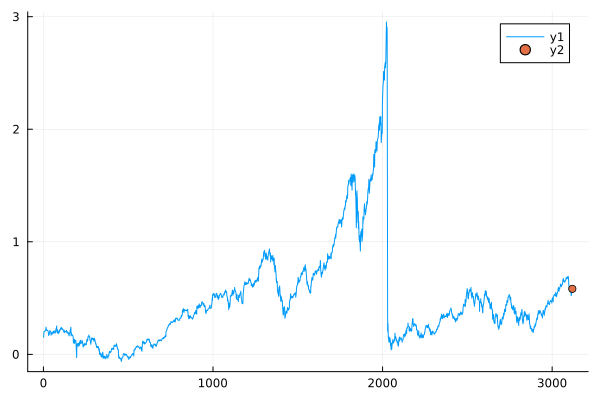

In [68]:
plot(1:length(ytest), ytest)
#scatter!(1:length(ytest), ytest, ms=.8)
scatter!([length(ytest)], [pred])

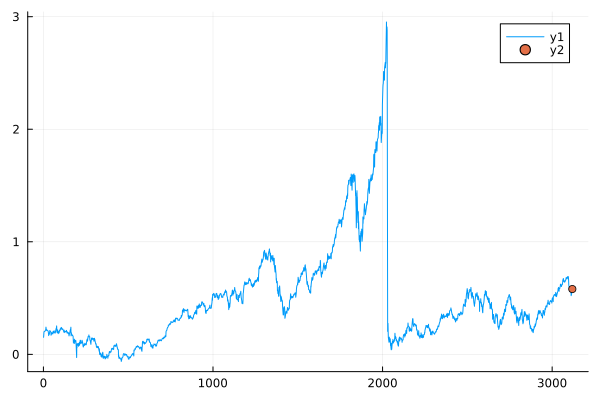

In [170]:
# option 5
plot(1:length(ytest), ytest)
#scatter!(1:length(ytest), ytest, ms=.8)
scatter!([length(ytest)], [pred])

In [69]:
mutable struct MyLSTMCell
    in_features::Int
    hidden_size::Int
    out_features::Int

    function getmodel(in_features, hidden_size, out_features)
        """
        """
        return Chain(
            LSTM(in_features => hidden_size),
            #Flux.relu,
            Dense(hidden_size => out_features)
            )
    end
end

In [90]:
Base.@kwdef mutable struct MyCell2
    in_features::Int = 1
    hidden_size::Int = 32
    out_features::Int = 1
    model::Function = (in_features, hidden_size, out_features) -> Chain(
        LSTM(in_features => hidden_size),
        #Flux.relu,
        Dense(hidden_size => out_features)
        )
end

MyCell2

In [95]:
mymodel = MyCell2().model(1,32,1)

Chain(
  Recur(
    LSTMCell(1 => 32),                  # 4_416 parameters
  ),
  Dense(32 => 1),                       # 33 parameters
)         # Total: 7 trainable arrays, 4_449 parameters,
          # plus 2 non-trainable, 64 parameters, summarysize 17.840 KiB.

In [230]:
plot(testdate, xtest)
#plot!(length(ytrain):length(ytest), ytest)

attempt to save state beyond implementation limit
attempt to save state beyond implementation limit


In [231]:
for data in first(trainloader)
    Flux.train!(my_se, ps, data, opt)
    
end

UndefVarError: UndefVarError: `my_se` not defined

In [530]:
ps = Flux.params(model)
opt= Adam(1e-3)
for databatch ∈ trainloader
    X, Y = databatch
    Flux.train!(loss, ps, zip(X,Y), opt)
end

MethodError: MethodError: no method matching (::Flux.LSTMCell{Matrix{Float32}, Matrix{Float32}, Vector{Float32}, Tuple{Matrix{Float32}, Matrix{Float32}}})(::Tuple{Matrix{Float32}, Matrix{Float32}}, ::Float32)

Closest candidates are:
  (::Flux.LSTMCell{I, H, V, <:Tuple{AbstractMatrix{T}, AbstractMatrix{T}}})(::Any, !Matched::AbstractVecOrMat) where {I, H, V, T}
   @ Flux ~/.julia/packages/Flux/HdfYB/src/layers/recurrent.jl:310


In [433]:
for databatch ∈ trainloader
    X, Y = databatch
    #println(Flux.Data.batchseq(X, 0))
    println(model(X))
end

MethodError: MethodError: no method matching +(::Vector{Float32}, ::Float32)
For element-wise addition, use broadcasting with dot syntax: array .+ scalar

Closest candidates are:
  +(::Any, ::Any, !Matched::Any, !Matched::Any...)
   @ Base operators.jl:578
  +(!Matched::T, ::T) where T<:Union{Float16, Float32, Float64}
   @ Base float.jl:408
  +(!Matched::Union{InitialValues.NonspecificInitialValue, InitialValues.SpecificInitialValue{typeof(+)}}, ::Any)
   @ InitialValues ~/.julia/packages/InitialValues/OWP8V/src/InitialValues.jl:154
  ...


In [145]:
SamePad()

SamePad()

In [365]:
lstm = LSTM(1=>3)

Recur(
  LSTMCell(1 => 3),                     # 66 parameters
)         # Total: 5 trainable arrays, 66 parameters,
          # plus 2 non-trainable, 6 parameters, summarysize 592 bytes.

In [491]:

)

Chain(
  Recur(
    LSTMCell(1 => 16),                  # 1_184 parameters
  ),
  Dense(16 => 1),                       # 17 parameters
)         # Total: 7 trainable arrays, 1_201 parameters,
          # plus 2 non-trainable, 32 parameters, summarysize 5.152 KiB.

In [450]:
Xtrain[1]

1-element Vector{Float32}:
 -0.49784812

In [441]:
[model(xi) for xi in Xtrain[1:3]]

3-element Vector{Vector{Float32}}:
 [-0.017920015]
 [-0.02007664]
 [-0.014681811]

In [452]:
optim = Flux.setup(Flux.Adam(0.01), model)  # will store optimiser momentum, etc.

losses = []
@showprogress for epoch in 1:10
    for (x, y) in trainloader
        loss, grads = Flux.withgradient(model) do m
            # Evaluate model and loss inside gradient context:
            Flux.reset!(m)
            y_hat = m(x)[end]
            Flux.mse.(y_hat, y)
        end
        Flux.update!(optim, model, grads[1])
        push!(losses, loss)  # logging, outside gradient context
    end
end

DimensionMismatch: DimensionMismatch: layer LSTMCell(1 => 16) expects size(input, 1) == 1, but got 32-element Vector{Vector{Float32}}

In [388]:
lstm.(Xtrain[1:3])#, y[1:3]

3-element Vector{Vector{Float32}}:
 [-0.27928466, 0.2807899, 0.11526686]
 [-0.2794349, 0.28169063, 0.114814065]
 [-0.27981728, 0.28272897, 0.1146951]

In [500]:
@epoch 1

LoadError: LoadError: UndefVarError: `@epoch` not defined
in expression starting at /Users/danieldiazalmeida/Documents/DataScienceProjects/notebooks/AAPLStockForecasting_Julia.ipynb:1

In [409]:
m = Chain(
    LSTM(1 => hidden_size),
    Dense(hidden_size => 1)
)

Flux.reset!(m)
m.(Xtrain[1:3])

3-element Vector{Vector{Float32}}:
 [0.014432841]
 [0.02757751]
 [0.03936323]

In [399]:
m.(Xtrain[1:3], 0))

1-element Vector{Vector{Float32}}:
 [-0.039665636]

In [529]:
function loss(m, x, y)
    #m(x[1]) # ignores the output but updates the hidden states
    sum(mse(m(xi), yi) for (xi, yi) in zip(x[1:end], y))
  end

loss (generic function with 1 method)

In [413]:
loss(Xtrain[1:3], ytrain[1:3])

0.66434395f0